# Computer Vision - Face Detection

## Face Detection with Haarcascade and OpenCV

### CASCADE CLASSIFIER

- to start training we need two set of images, one composed only of people's faces (positive images) and the other with no people's faces (negative images)

- next step, send all the images to a machine learning algorithm called AdaBoost so that it learns the features of the images as well as the details of the faces.

- this algorithm will select the features of the images (feature selection). The idea is to apply each one of these squares (filters) in the image to each subwindow of the image and classify the image.

- the equation applied using filters is : sum of white pixels - sum of black pixels.

- each filter is applied using a sliding window.

- after the algorithm is trained, we have a final step that is called Cascade, which is the process of classifying an image, or in other words to detect the object or the face. You send an image to the trained algorithm, we have several classifiers, for example C_1 , C_2, C_3, C_N and the algorithm classifies that part of the image as face only if all the classifiers gives True, i.e. if they detect the face. These classifiers are the Haar features

#### loading the image

In [ ]:
import cv2
from google.colab.patches import cv2_imshow

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
image = cv2.imread('/content/drive/MyDrive//Computer Vision Masterclass/Images/people1.jpg')

In [ ]:
image.shape

(1280, 1920, 3)

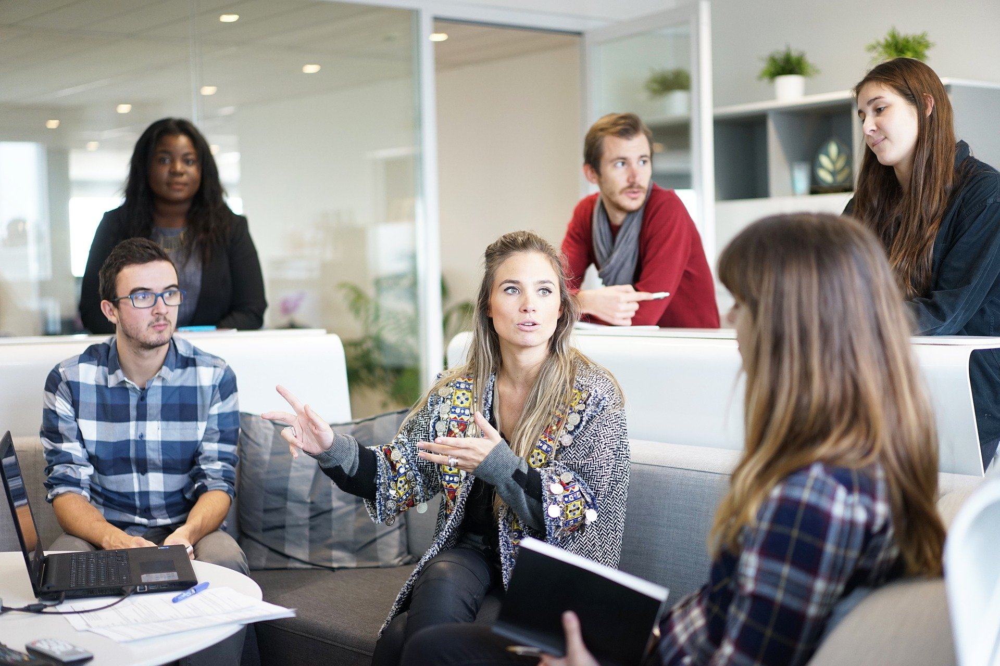

In [ ]:
cv2_imshow(image)

(600, 800, 3)


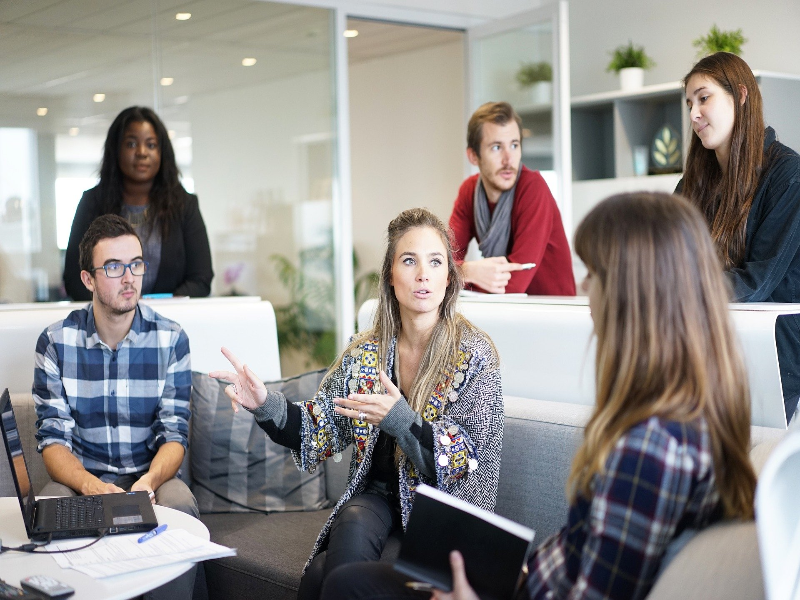

In [ ]:
image = cv2.resize(image, (800,600))
print(image.shape)
cv2_imshow(image)

#### convert to grayscale to speedup the face detection

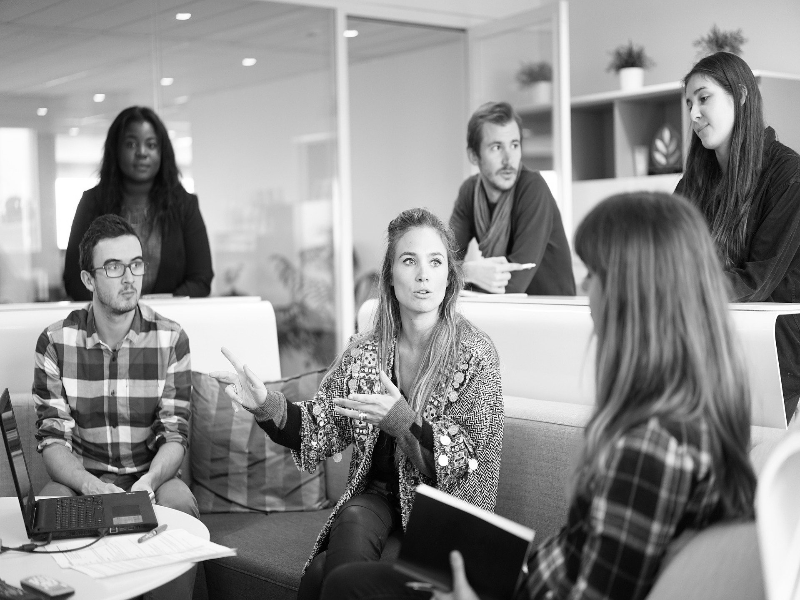

In [ ]:
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
cv2_imshow(image_gray)

#### detecting faces

In [ ]:
# load the trained classifier
face_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Computer Vision Masterclass/Cascades/haarcascade_frontalface_default.xml')

In [ ]:
# apply the algorithm to the image
detections = face_detector.detectMultiScale(image_gray)

In [ ]:
# the bounding boxes of the detected faces
detections

array([[677,  72,  68,  68],
       [115, 124,  53,  53],
       [475, 123,  59,  59],
       [387, 233,  73,  73],
       [ 92, 239,  66,  66],
       [390, 323,  56,  56]], dtype=int32)

In [ ]:
# draw bounding boxes on the image
for (x,y,w,h) in detections:
  cv2.rectangle(image, (x,y), (x+w, y+h) , (0,255,0), 2)

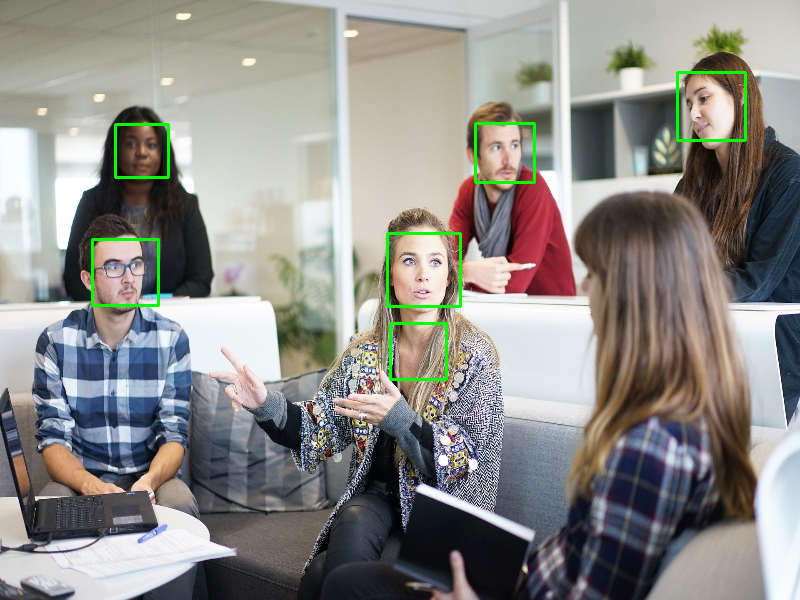

In [ ]:
cv2_imshow(image) #original image + faces bounding boxes
# there is a false positive

#### Harrcascade parameters
let's try to improve the results

we introduce the
- scaleFactor to emphasize that the faces have a certain size.
- minNeighbors
- minSize
- maxSize

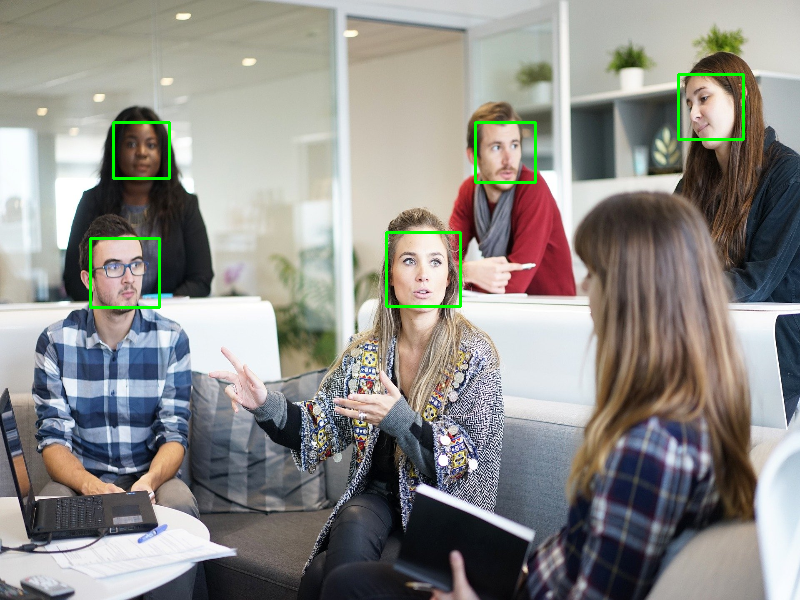

In [ ]:
image = cv2.imread('/content/drive/MyDrive//Computer Vision Masterclass/Images/people1.jpg')
image = cv2.resize(image, (800,600))

image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

face_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Computer Vision Masterclass/Cascades/haarcascade_frontalface_default.xml')
detections = face_detector.detectMultiScale(image_gray , scaleFactor = 1.09)

for (x,y,w,h) in detections:
  cv2.rectangle(image, (x,y), (x + w , y + h ), (0,255,0), 2)

cv2_imshow(image)

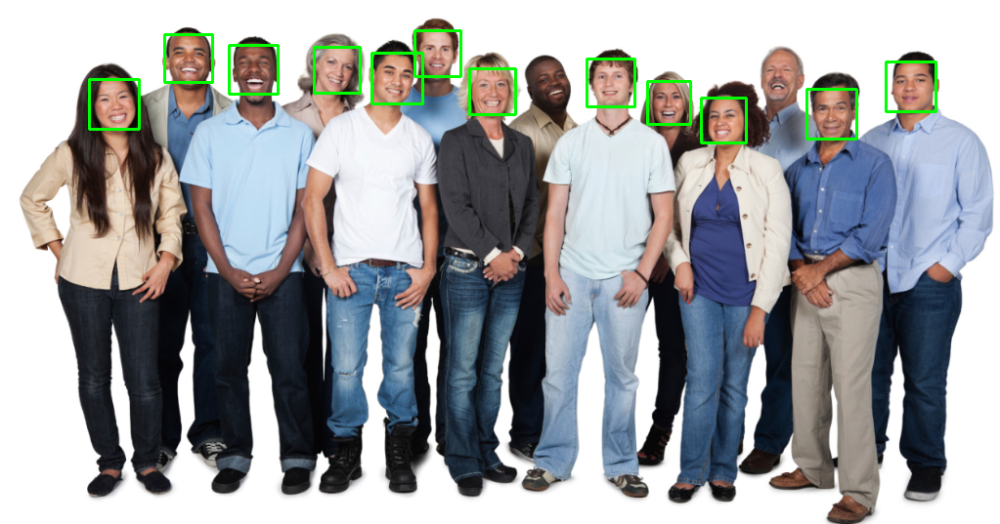

In [ ]:
image = cv2.imread('/content/drive/MyDrive//Computer Vision Masterclass/Images/people2.jpg')

image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

face_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Computer Vision Masterclass/Cascades/haarcascade_frontalface_default.xml')
detections = face_detector.detectMultiScale(image_gray , scaleFactor = 1.2,
                                            minNeighbors= 7,
                                            minSize =(10,10),
                                            maxSize = (100,100))

for (x,y,w,h) in detections:
  cv2.rectangle(image, (x,y), (x + w , y + h ), (0,255,0), 2)

cv2_imshow(image)

#### Eye Detection

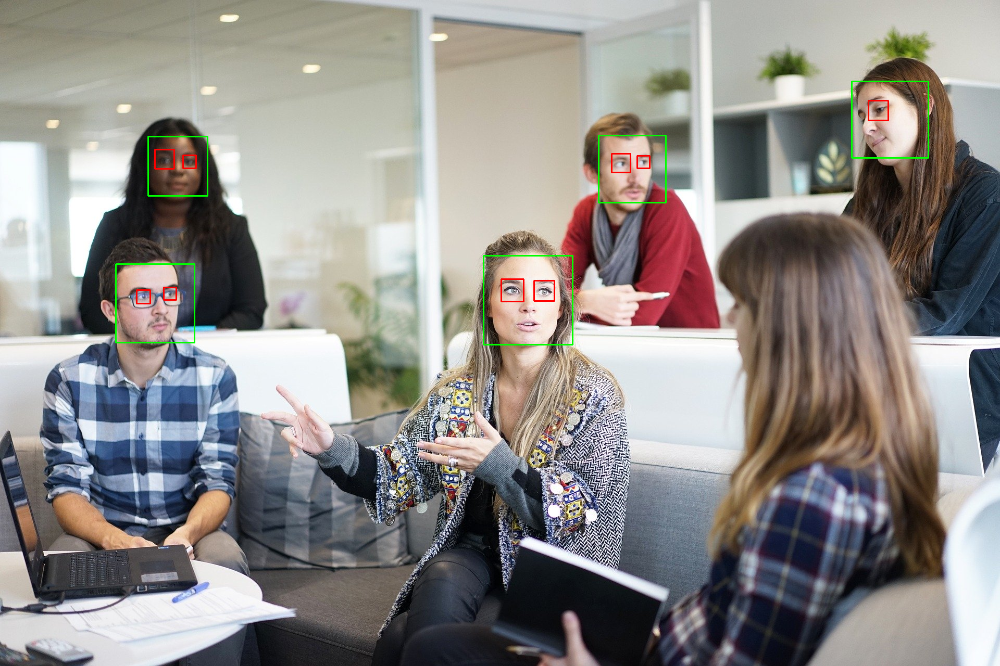

In [ ]:
image = cv2.imread('/content/drive/MyDrive//Computer Vision Masterclass/Images/people1.jpg')
# image = cv2.resize(image, (800,600))

image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

face_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Computer Vision Masterclass/Cascades/haarcascade_frontalface_default.xml')
detections = face_detector.detectMultiScale(image_gray , scaleFactor = 1.3 , minSize =(30,30))

eye_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Computer Vision Masterclass/Cascades/haarcascade_eye.xml')
eye_detections = eye_detector.detectMultiScale(image_gray, scaleFactor = 1.1 , minNeighbors = 10, maxSize = (70,70))

for (x,y,w,h) in detections:
  cv2.rectangle(image, (x,y), (x + w , y + h ), (0,255,0), 2)

for (x,y,w,h) in eye_detections:
  cv2.rectangle(image, (x,y), (x+w , y + h), (0,0,255), 2)
cv2_imshow(image)

#### Homework
- detect cars
- detect clocks
- detect people full body


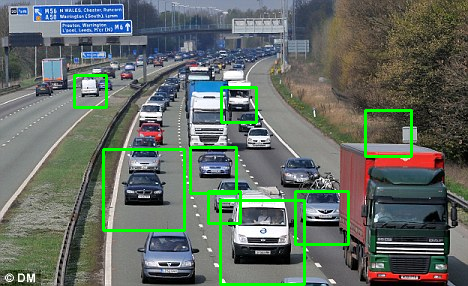

In [ ]:
# detect cars
image = cv2.imread('/content/drive/MyDrive//Computer Vision Masterclass/Images/car.jpg')

image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

car_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Computer Vision Masterclass/Cascades/cars.xml')
detections = car_detector.detectMultiScale(image_gray , scaleFactor = 1.03,
                                           minNeighbors = 5)

for (x,y,w,h) in detections:
  cv2.rectangle(image, (x,y), (x + w , y + h ), (0,255,0), 2)

cv2_imshow(image)

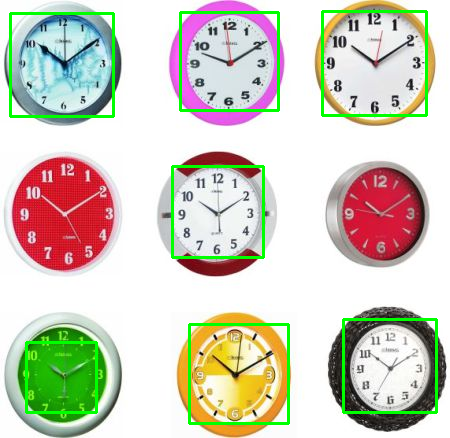

In [ ]:
#clocks
clock_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Computer Vision Masterclass/Cascades/clocks.xml')
image = cv2.imread('/content/drive/MyDrive/Computer Vision Masterclass/Images/clock.jpg')
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
detections = clock_detector.detectMultiScale(image_gray, scaleFactor = 1.03, minNeighbors=1)
for (x, y, w, h) in detections:
  cv2.rectangle(image, (x, y), (x + w, y + h), (0,255,0), 2)
cv2_imshow(image)

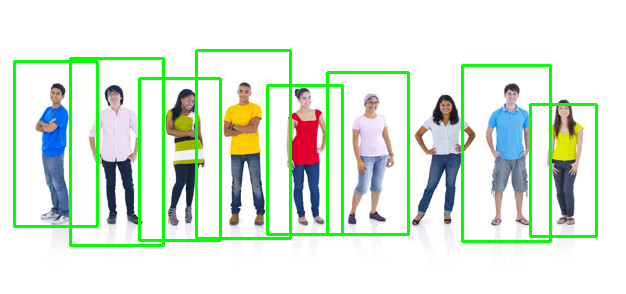

In [ ]:
# people full body
full_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Computer Vision Masterclass/Cascades/fullbody.xml')
image = cv2.imread('/content/drive/MyDrive/Computer Vision Masterclass/Images/people3.jpg')
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
detections = full_detector.detectMultiScale(image_gray, scaleFactor = 1.05, minNeighbors=5,
                                              minSize = (50,50))
for (x, y, w, h) in detections:
  cv2.rectangle(image, (x, y), (x + w, y + h), (0,255,0), 2)
cv2_imshow(image)

What is a Feature Descriptor?
A feature descriptor is a representation of an image or an image patch that simplifies the image by extracting useful information and throwing away extraneous information.

Typically, a feature descriptor converts an image of size width x height x 3 (channels ) to a feature vector / array of length n.

In the HOG feature descriptor, the distribution ( histograms ) of directions of gradients ( oriented gradients ) are used as features. Gradients ( x and y derivatives ) of an image are useful because the magnitude of gradients is large around edges and corners ( regions of abrupt intensity changes ) and we know that edges and corners pack in a lot more information about object shape than flat regions.

## Face Detection with HOG and Dlib

- HOG: Histogram of Oriented Gradients

- calculate the gradient of the image:
consider a block of 3x3 pixels and compute Gx and Gy for each pixel

Gx(r,c) = I(r, c+1) - I(r,c-1)
Gy(r,x) = I(r-1,c) - I(r+1,c)

- after computed Gx and Gy you compute the magnitude and angle of each piel

magnitude = sqrt(Gx^2 + Gy^2)
angle = abs(tan^-1 (Gy/Gx))

- the gradient matrices (magnitude and angle matrices) are divided into 8x8 cells to form a block. for each block, a nine-point histogram is calculated, i.e, a histogram with nine bins, each bin has amn angle range of 20 degrees.

- each of these nine-point histograms can be plotted as histograms with bins outputting the intensity of the gradient in that bin.

- for each block (of 64 pixels) will be filled the histogram. will be computed:
number_of_bins = 9
step_size(angle) =20°

- each J_th bin will have boundaries:
[0,20), [20,40) and so on

- the histogram is filled by taking the gradient magnitude matrix and the gradient direction matrix.

- then you consider the final histogram and the original image to check whether a particular object is present in the image




In [ ]:
# Python gradient calculation

# Read image
#im = cv2.imread('bolt.png')
#im = np.float32(im) / 255.0

# Calculate gradient
#gx = cv2.Sobel(img, cv2.CV_32F, 1, 0, ksize=1)
#gy = cv2.Sobel(img, cv2.CV_32F, 0, 1, ksize=1)


In [ ]:
# Python Calculate gradient magnitude and direction ( in degrees )
# mag, angle = cv2.cartToPolar(gx, gy, angleInDegrees=True)

One of the important reasons to use a feature descriptor to describe a patch of an image is that it provides a compact representation. An 8×8 image patch contains 8x8x3 = 192 pixel values. The gradient of this patch contains 2 values ( magnitude and direction ) per pixel which adds up to 8x8x2 = 128 numbers.

By the end of this section we will see how these 128 numbers are represented using a 9-bin histogram which can be stored as an array of 9 numbers. Not only is the representation more compact, calculating a histogram over a patch makes this represenation more robust to noise. Individual graidents may have noise, but a histogram over 8×8 patch makes the representation much less sensitive to noise.


The histogram is essentially a vector ( or an array ) of 9 bins ( numbers ) corresponding to angles 0, 20, 40, 60 … 160.


The next step is to create a histogram of gradients in these 8×8 cells. The histogram contains 9 bins corresponding to angles 0, 20, 40 … 160.

A bin is selected based on the direction, and the vote ( the value that goes into the bin ) is selected based on the magnitude.

The contributions of all the pixels in the 8×8 cells are added up to create the 9-bin histogram.

NEXT STEP:

In the previous step, we created a histogram based on the gradient of the image. Gradients of an image are sensitive to overall lighting. If you make the image darker by dividing all pixel values by 2, the gradient magnitude will change by half, and therefore the histogram values will change by half.

Ideally, we want our descriptor to be independent of lighting variations. In other words, we would like to “normalize” the histogram so they are not affected by lighting variations.

you may be tempted to think that while calculating HOG you can simply normalize the 9×1 histogram the same way we normalized the 3×1 vector above. It is not a bad idea, but a better idea is to normalize over a bigger sized block of 16×16.

A 16×16 block has 4 histograms which can be concatenated to form a 36 x 1 element vector and it can be normalized just the way a 3×1 vector is normalized. The window is then moved by 8 pixels ( see animation ) and a normalized 36×1 vector is calculated over this window and the process is repeated.

NEXT STEP:

To calculate the final feature vector for the entire image patch, the 36×1 vectors are concatenated into one giant vector.

In [ ]:
import dlib

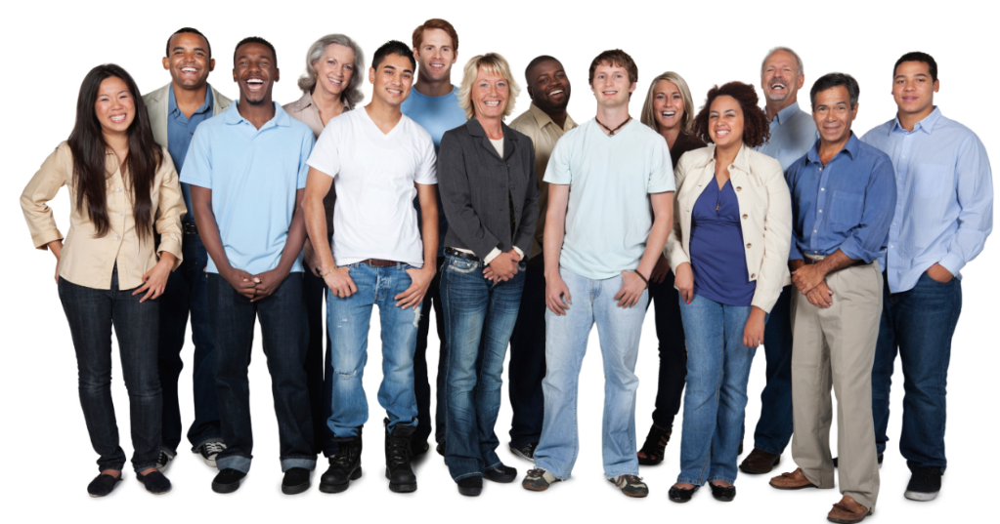

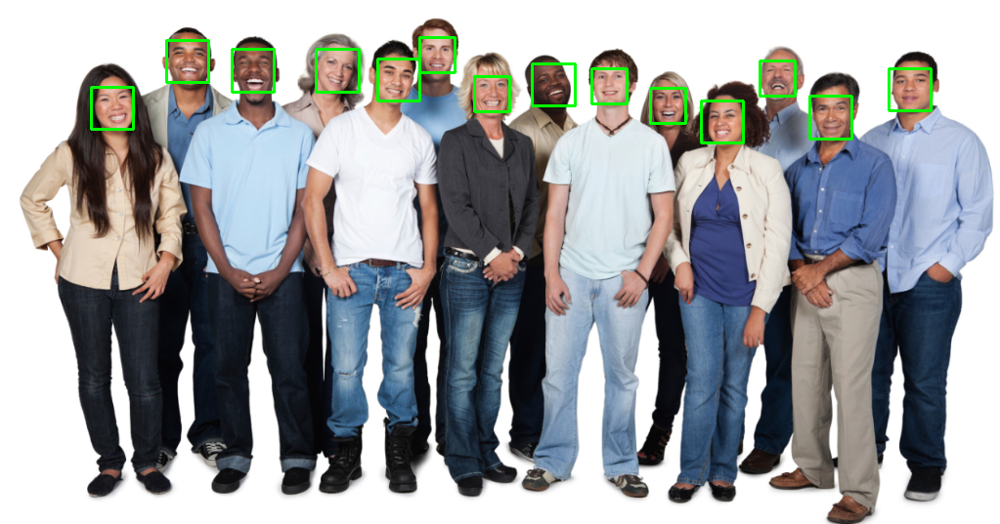

In [ ]:
image = cv2.imread('/content/drive/MyDrive/Computer Vision Masterclass/Images/people2.jpg')
cv2_imshow(image)

face_detector_hog = dlib.get_frontal_face_detector()

detections = face_detector_hog(image ,1)

for face in detections:
  l, t, r, b = face.left(), face.top(), face.right(), face.bottom()

  cv2.rectangle(image , (l,t), (r,b), (0,255,0), 2)

cv2_imshow(image)

## Face Detection with CNN and Dlib

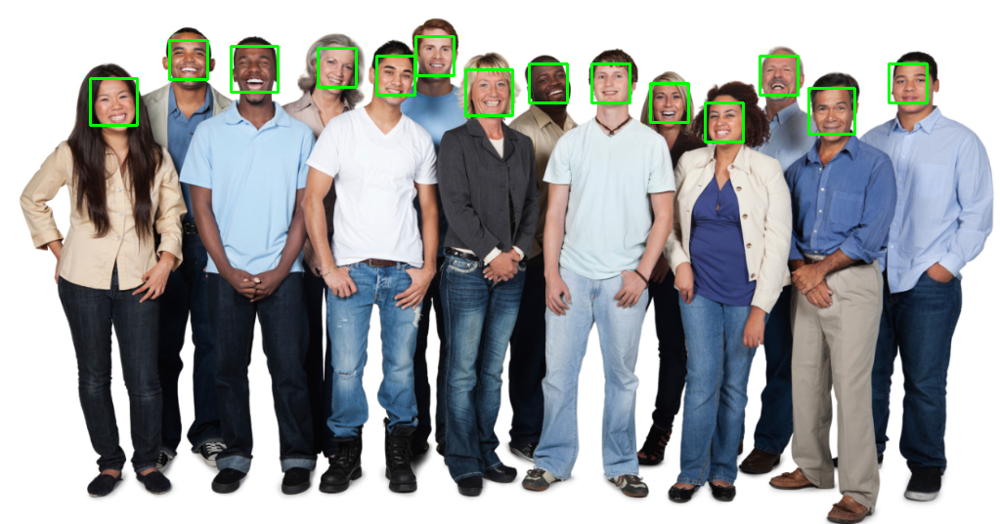

In [ ]:
image = cv2.imread('/content/drive/MyDrive/Computer Vision Masterclass/Images/people2.jpg')
cnn_detector = dlib.cnn_face_detection_model_v1('/content/drive/MyDrive/Computer Vision Masterclass/Weights/mmod_human_face_detector.dat')

detections = cnn_detector(image,1)

for face in detections:
  l, t, r, b, c = face.rect.left(), face.rect.top(), face.rect.right(), face.rect.bottom(), face.confidence

  cv2.rectangle(image, (l,t), (r,b), (0,255,0), 2)

cv2_imshow(image)

homework

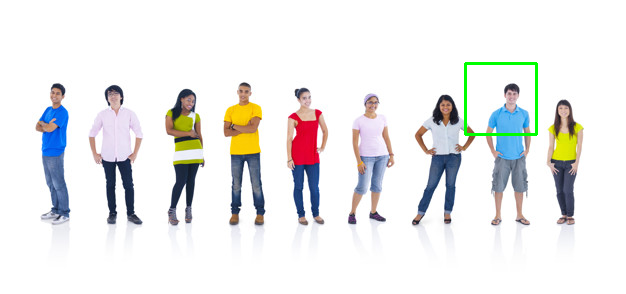

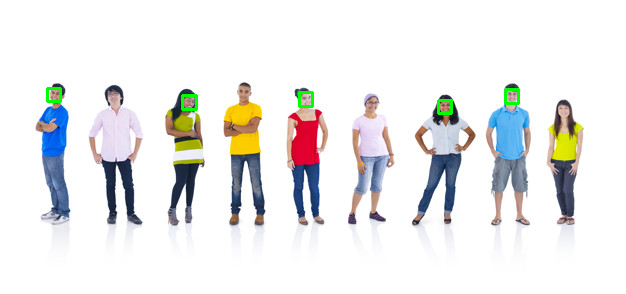

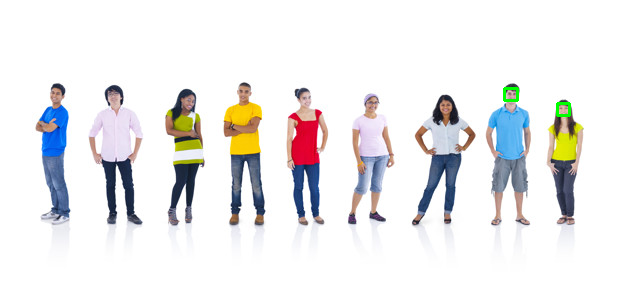

In [ ]:
# apply haarcascades, hog and cnn to the image people3.jpg

#haarcascades

image = cv2.imread('/content/drive/MyDrive//Computer Vision Masterclass/Images/people3.jpg')

image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

face_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Computer Vision Masterclass/Cascades/haarcascade_frontalface_default.xml')
detections = face_detector.detectMultiScale(image_gray , scaleFactor = 1.001)

for (x,y,w,h) in detections:
  cv2.rectangle(image, (x,y), (x + w , y + h ), (0,255,0), 2)

cv2_imshow(image)

# hog

image = cv2.imread('/content/drive/MyDrive/Computer Vision Masterclass/Images/people3.jpg')

face_detector_hog = dlib.get_frontal_face_detector()

detections = face_detector_hog(image ,4)

for face in detections:
  l, t, r, b = face.left(), face.top(), face.right(), face.bottom()

  cv2.rectangle(image , (l,t), (r,b), (0,255,0), 2)

cv2_imshow(image)

# cnn

image = cv2.imread('/content/drive/MyDrive/Computer Vision Masterclass/Images/people3.jpg')
cnn_detector = dlib.cnn_face_detection_model_v1('/content/drive/MyDrive/Computer Vision Masterclass/Weights/mmod_human_face_detector.dat')

detections = cnn_detector(image,4)

for face in detections:
  l, t, r, b, c = face.rect.left(), face.rect.top(), face.rect.right(), face.rect.bottom(), face.confidence

  cv2.rectangle(image, (l,t), (r,b), (0,255,0), 2)

cv2_imshow(image)

## Face Detection using webcam